# **Class Agnostic Semantic Edges**
Name: Ibrahim Kashif  
Email: i2kashif@uwaterloo.ca


# **Abstract**
This project will focus on developing a deep learning model for detecting class agonistic semantic edges using the PASCAL VOC dataset. Semantic edges allows us to seperate various semantic classes within images, however, these edges represent a very small fraction of an image's data, which leads to a significant imbalance. Our main goal is to refine the model's ability to detect these sparse features.

To handel the issue regarding data imbalance in relation to edge detection, our approach incorporates a weighted loss function (weighted binary cross entropy) where errors in predicting edge pixles are given more significance over errors for non edge pixles. This stradegy allows us to ensure that our model prioritizes acturate edge detection during training, which consequently, allows the model to be trained towards higher accuracy in detecting these features. The architectural backbone of our model is based on the VGGNET, which is known for its feature extraction capabilities in image processing tasks. We change the networks decision head to use sigmoid (instead of softmax), which outputs a binary mask where each pixel value indicates the likelihood of being an edge.

Moreover the model integrates the principles of Hollistically Nested Edge Detetction (HED), which is an architecture that builds upon traditional deep convolution networks. HED performs deep supervision at multiple scales of the image simulatineously which effectively allows us to improve the accuracy by which we detect edges. HED comprises a single stream deep network with multiple side outputs at each convolution layer to enforce rich hierarchical representation. This representation allows us to resolve the challaneges caused by the high variabilty and fine granularity of edges within images.

The training process is carried out by strictly focusing on optimizing the average and fused outputs from the model to determine which approach results in higher precision and recall for predicting edges. Averaging combines side outputs produced at different stages within the network into a mean inorder to stabilize predictions by reducing variance and noise that might exist in individual outputs. Conversely, fusing entails combining them through a learned fusion layer where each side output contributes according to its predictive power. Fusion allows the model to detect complex patterns and subtle variations in edge characteristics that may not be captured using average pooling.

We proceed by taking a deeper look at what weighted binary cross entropy is and how it helps us solve our problem of imbalanced data.

## **Weighted Binary Cross Entropy**

Weighted Binary Cross Entropy is a loss function used in training deep learning models. It is mainly used to tackle issues brought about due to imbalanced data, which makes it perfect for our problem. Weighted Binary Cross Entropy is a modification of the tradiotional Binary Cross Entropy loss, which accounts for the imbalance by applying different weights to classes within the dataset. In our case we have two classes either a pixel is an edge (positive class) or it is not an edge (negative class).

In the context of edge detection, the number of non edge pixels is very large in comparision to the number of edge of edge pixels. As non edge pixels signifcantly out weigh edge pixels their is an inherint bias towards predicting non edge pixles. Weighted Binary Cross Entropy tackles this problem by introducing a weight factor (β) that adjusts the siginificance given to each class during the training phase. The loss contributed by edge pixles is assigned a higher weight relative to the loss brought about due to edge pixels allowing us to accurately detect edges. As previous mentioned we use a weight factor (β) which is determined based on the ratio of non edge pixels and total pixels in the image. This dynamically compution of β allows us to factor in training for images where there are different edge to non edge ratios.

Weighted Binary Cross Entropy loss can be expressed as the following mathematical equation:

$$l_{side}^{(m)} = -\beta \sum_{j \in Y^+} \log \text{Pr}(y_j = 1 | X; W, w^{(m)}) - (1 - \beta) \sum_{j \in Y^-} \log \text{Pr}(y_j = 0 | X; W, w^{(m)})$$

Where $X_n = \{x_j^{(n)}, j = 1, ..., |X_n|\}$ denotes the raw image input and $Y_n = \{y_j^{(n)}, j = 1, ..., |X_n|\}$, $y_j^{(n)} ∈ \{0, 1\}$ denotes the corresponding ground truth binary edge map for the image $X_n$ (We don't use the n in the formula for notational simplicity). We denote the collection of all standard network layer parameters as W. Suppose in the network we have M side-output layers. Each side-output layer is also associated with a classifier, in which the corresponding weights are denoted as $w = (w^{(1)}, ..., w^{(n)} )$. $β = \frac{|Y\_|}{|Y|}$ and $1 - β = \frac{|Y+|}{|Y|}$. $|Y\_|$ and $|Y_+|$ denote the edge and non edge ground truth label sets, respectively.

During training, this loss function ensures that mistakes made by the model in predicting edge pixels have a higher cost associated with them than mistakes made in predicting non edge pixels. Using this weighting differential allows us to effectively train the model to recognize and predict edges more accurately despite their sparse presence in the data set.



## **Hollistically Nested Edge Detetction (HED)**

HED applies deep learning to enhance the accuracy and efficiency of locating edges when compared to traditional methods. HED's architecture is based on VGGNet model but it adds side outputs at each convolution layer, to allow the network to learn rich hierarchical representations of features at multiple scales.  Each side output is connected to a 1x1 convolution layer that maps feature maps to edge predictions at the corresponding scale.

Rather than relying on the final output of the network, HED imposes supervision at the intermediate layers (side outputs), by allowing gradients to flow directly back from these layers during training. These earlier layers are thus encouraged towards learning more discriminative features on their own and they are also able to enhance this learning process, which eventually results into better performance.

Each side output in HED has a weighted binary cross entropy loss function and fusion layer. To balance between edge and non-edge pixels in each loss function, we used weight factor (β) which was determined based on the ratio of non-edge pixels and total pixels in the image.  This allows us to effectively adjust the importance given to the positive (edge) and negative (non edge) classes, preventing the model from being biased towards the more prevalent non edge class.

In the final stage of the HED model, we fuse outputs from all side layers through a learned fusion layer. This fusion process reuslts in a final edge map that is both precise and refined.


## **Imports**

In [ ]:
# Imports for the notebook
# Importing essential libraries for basic image manipulations.
import numpy as np
import PIL
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
from tqdm import tqdm

# Import some PyTorch and TorchVision libraries
import torch
import torchvision
import torch.nn.functional as F
from torch import nn
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as tF
from torchvision.datasets.voc import VOCDetection, VOCSegmentation
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
from torchvision import models
import torch.optim as optim
import random

## **Check PyTorch version and CUDA availabilty**

In [ ]:
# Check PyTorch version
print("PyTorch Version:", torch.__version__)
# Check CUDA availability
print("CUDA Available:", torch.cuda.is_available())

PyTorch Version: 2.2.1+cu121
CUDA Available: True


## **Set Device**

In [ ]:
# Setting the device to GPU if available, else to CPU
device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# Printing the device being used
print("Using device:", device)

Using device: cuda:0


## **Download the dataset**

In [ ]:
# Downloading and preparing the VOC segmentation dataset
# Use download = True to only downlaod the dataset once
torchvision.datasets.VOCSegmentation(root='/data/', download=True)

100%|██████████| 1999639040/1999639040 [01:00<00:00, 32796268.84it/s]


Extracting /data/VOCtrainval_11-May-2012.tar to /data/


Dataset VOCSegmentation
    Number of datapoints: 1464
    Root location: /data/

## **Initialize training parameters**

In [ ]:
# Hyperparameters and normalization constants
learning_rate = 0.0005 # Learning rate for the optimizer
batch_size = 32 # Batch size for training and validation
image_size = 224 # Size to which input image will be resize to
imagenet_mean = [0.485, 0.456, 0.406] # Mean of the VOCDataset dataset for normalizing
imagenet_std = [0.229, 0.224, 0.225] # Standard Deviation of the VOCDataset dataset for normalizing

##  **Edge Replacement**

In [ ]:
# Function to replace edge pixels with zero
def replace_edges_with_zero(tensor, a):
  """
  Replaces edge pixels, identified by the value 255, with zero in the tensor.

  Parameters:
        tensor (torch.Tensor): The input tensor that contains image data where edges are marked.
        a (int): The pixel value in the tensor that indicates an edge set to 255 for edges in grayscale images.

  Returns:
        torch.Tensor: A tensor where pixels equal to 'a' are set to 0 (indicating edge pixels),
                      and all other pixels are set to 1 (indicating non-edge pixels).
  """
  tensor = torch.tensor(np.where(tensor == a, 0, 1)) # Replace edge pixles (255) with 0 and non edge pixles with 1
  return tensor

## **Data Preprocessing and Dataset Preparation**

In [ ]:
# Image and target transformations
input_resize = transforms.Resize((image_size, image_size)) # Resize the input images to 224x224
input_transform = transforms.Compose(
    [
        input_resize, # Resize transformation
        transforms.ToTensor(), # Convert images to tensor
        transforms.Normalize(imagenet_mean, imagenet_std), # Normalize images
    ]
)

target_resize = transforms.Resize((image_size, image_size), interpolation=InterpolationMode.NEAREST) # Resize targets to 224x224 using nearest interpolation to preserve label values
target_transform = transforms.Compose(
    [
        target_resize,  # Resize transformation
        transforms.PILToTensor(), # Convert images to tensor
        transforms.Lambda(lambda x: replace_edges_with_zero(x.squeeze(0).long(), 255)), # Replace edge pixles (255) with 0 and non edge pixles with 1
    ]
)

# Creating the dataset for training, validation, and testing
train_dataset = VOCSegmentation(
    '/data/', # Dataset directory
    year='2012', # Dataset year
    image_set='train', # Use training set
    transform=input_transform, # Apply input transforms
    target_transform=target_transform, # Apply target transforms
)

train_val_dataset = VOCSegmentation(
    '/data/', # Dataset directory
    year='2012', # Dataset year
    image_set='trainval', # Use training and validation set
    transform=input_transform, # Apply input transforms
    target_transform=target_transform, # Apply target transforms
)

test_dataset = VOCSegmentation(
    '/data/', # Dataset directory
    year='2012', # Dataset year
    image_set='val', # Use validation set
    transform=input_transform, # Apply input transforms
    target_transform=target_transform, # Apply target transforms
)

## **Data Loaders Setups**

In [ ]:
# Create data loaders for the training, validation, and test datasets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) # Loader for training dataset
train_val_loader = DataLoader(train_val_dataset, batch_size=batch_size, shuffle=True)  # Loader for training-validation dataset
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True) # Loader for test dataset

## **Display Function for Images and Masks**

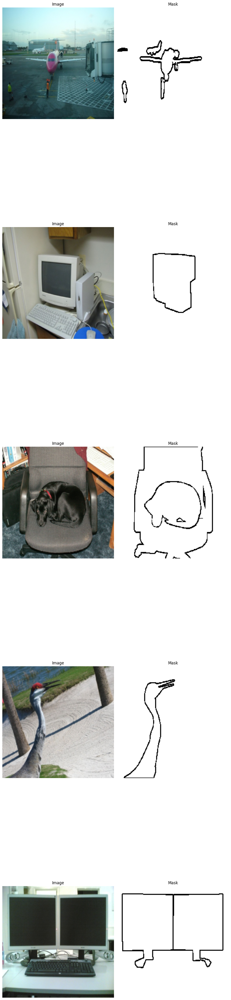

In [ ]:
# Function to display sample images and their corresponding masks from a dataset
def display_images_and_masks(dataset, num_samples=5):
    """
    Displays a set of image and mask pairs from the specified dataset.

    Parameters:
        dataset (Dataset): A dataset object that supports indexing to retrieve images and their corresponding masks.
        num_samples (int): Number of samples to display from the dataset. Default is 5.
    """
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 10*num_samples))

    for i in range(num_samples):
        # sample_index = np.random.randint(0, len(dataset))
        sample_index = i
        image, mask = dataset[sample_index]

        # Denormalize the image
        for channel in range(3):
            image[channel, :, :] = (image[channel, :, :] * imagenet_std[channel]) + imagenet_mean[channel]
        image = image.permute(1, 2, 0).numpy()

        # Convert mask to numpy array
        mask = mask.squeeze().numpy()

        # Plot the image
        axes[i, 0].imshow(image)
        axes[i, 0].set_title('Image')

        # Plot the mask
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title('Mask')

        # Remove axis ticks
        axes[i, 0].axis('off')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Call the function to display images and masks
display_images_and_masks(train_dataset, num_samples=5)

## **Holistically-Nested Edge Detection (HED) Model Definition**

In [ ]:
# Definition of the HED model class using PyTorch
class HED(nn.Module):
    def __init__(self):
        super(HED, self).__init__()
        # Load pretrained VGG16 model features
        vgg_pretrained_features = models.vgg16(pretrained=True).features

        # Define convolutional blocks with pretrained VGG16 features, stopping at each max pooling layer
        self.conv1 = nn.Sequential(*vgg_pretrained_features[:4])   # First max pooling
        self.conv2 = nn.Sequential(*vgg_pretrained_features[4:9])  # Second max pooling
        self.conv3 = nn.Sequential(*vgg_pretrained_features[9:16]) # Third max pooling
        self.conv4 = nn.Sequential(*vgg_pretrained_features[16:23])# Fourth max pooling
        self.conv5 = nn.Sequential(*vgg_pretrained_features[23:30])# Fifth max pooling

        # Side output layers, 1x1 convolutions
        self.side_output1 = nn.Conv2d(64, 1, kernel_size=1)
        self.side_output2 = nn.Conv2d(128, 1, kernel_size=1)
        self.side_output3 = nn.Conv2d(256, 1, kernel_size=1)
        self.side_output4 = nn.Conv2d(512, 1, kernel_size=1)
        self.side_output5 = nn.Conv2d(512, 1, kernel_size=1)

        # Fusion layer to combine the side outputs
        self.fuse = nn.Conv2d(5, 1, kernel_size=1)

    def forward(self, x):
        """
        Forward pass through the HED model.

        Parameters:
            x (Tensor): Input tensor of shape (batch size, channels, height, width)

        Returns:
            Tuple[Tensor]: A tuple containing the fused final output and each of the side outputs.
        """
        # Pass input through convolutional blocks
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x4 = self.conv4(x3)
        x5 = self.conv5(x4)

        # Side outputs
        d1 = self.side_output1(x1)
        d2 = self.side_output2(x2)
        d3 = self.side_output3(x3)
        d4 = self.side_output4(x4)
        d5 = self.side_output5(x5)

        # Upsample to the size of the input image
        d1 = F.interpolate(d1, size=x.size()[2:], mode='bilinear', align_corners=True)
        d2 = F.interpolate(d2, size=x.size()[2:], mode='bilinear', align_corners=True)
        d3 = F.interpolate(d3, size=x.size()[2:], mode='bilinear', align_corners=True)
        d4 = F.interpolate(d4, size=x.size()[2:], mode='bilinear', align_corners=True)
        d5 = F.interpolate(d5, size=x.size()[2:], mode='bilinear', align_corners=True)

        # Concatenate side outputs and pass through the fusion layer
        fused_output = torch.cat((d1, d2, d3, d4, d5), dim=1)
        final_output = self.fuse(fused_output)

        # Return the final fused output and individual side outputs
        return final_output, d1, d2, d3, d4, d5

## **Training Loss**

In [ ]:
# Function to compute training loss edge detection using weighted binary cross entropy
def training_loss_function(fuse, d1, d2, d3, d4, d5, Y):
  """
  Calculate the loss for the outputs from the HED model.

  Parameters:
        fuse (Tensor): The final fused output from the HED model.
        d1, d2, d3, d4, d5 (Tensor): The side outputs from the HED model at various depths.
        Y (Tensor): The ground truth labels for the edges.

  Returns:
        float: The total loss calculated as the sum of the weighted losses from the side outputs and the loss from the fused output.
  """
  loss = 0
  relative_weights = [1, 1, 1, 1, 1, 1] # Weights for the side outputs
  outputs = [fuse, d1, d2, d3, d4, d5] # List of side outputs
  Y = Y.unsqueeze(1) # Add a channel dimension to Y

  # Compute weighted loss for each side output and fuse
  for output, weight in zip(outputs, relative_weights):
    loss += weight* weighted_binary_cross_entropy_loss(output, Y)
  return loss

## **Weighted Binary Cross Entropy Loss**

In [ ]:
# Function to compute weighted binary cross entropy loss
def weighted_binary_cross_entropy_loss(input, target):
  """
  Calculates weighted binary cross entropy loss.

  Parameters:
        input (Tensor): The predicted logits from the model, expected size [batch_size, channels, height, width].
        target (Tensor): The ground truth labels, expected size [batch_size, height, width].

  Returns:
        Tensor: The calculated weighted binary cross entropy loss.
  """

  # Count non-edge and edge pixels
  non_edges = torch.sum(1 - input.view(-1)).float() # Count of non-edge pixels
  edges = torch.sum(target.view(-1)).float() # Count of edge pixels
  pos_weight=torch.tensor([0.10*(non_edges/edges)]) # Compute class imbalance weight

  # Move the weight tensor to the cuda:0
  pos_weight = pos_weight.to(device)

  # Set up the weighted loss criterion
  criterion_weighted = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

  # Reshape input and target for loss computation
  input_reshaped = input.reshape(input.shape[0], 224*224)
  target_reshaped = target.reshape(target.shape[0], 224*224)

  # Compute the loss
  loss_weighted = criterion_weighted(input_reshaped, target_reshaped)

  # Return the loss
  return loss_weighted


## **Simulating Model Outputs and Loss Calculation**

In [ ]:
# Test input and target tensor creation for model output simulation
input1 = torch.randn(batch_size, 1, 224, 224).to(device)
input2 = torch.randn(batch_size, 1, 224, 224).to(device)
input3 = torch.randn(batch_size, 1, 224, 224).to(device)
input4 = torch.randn(batch_size, 1, 224, 224).to(device)
input5 = torch.randn(batch_size, 1, 224, 224).to(device)
input6 = torch.randn(batch_size, 1, 224, 224).to(device)

# Create a random binary target tensor
target = torch.randint(0, 2, (batch_size, 224, 224)).to(device)

# Output the shape of the target and compute loss using the training loss function
print(target.shape)
print(training_loss_function(input1.float(), input2.float(), input3.float(), input4.float(), input5.float(), input6.float(), target.float()))

torch.Size([32, 224, 224])
tensor(2.8989, device='cuda:0')


## **Training Function**

In [ ]:
# Function to train the model
def train(model,data_loader,criterion,optimizer):
    """
    Training loop for the model over one epoch.

    Parameters:
        model (torch.nn.Module): The neural network model to train.
        data_loader (torch.utils.data.DataLoader): DataLoader that provides batches of data for training.
        criterion (function): Loss function to measure the error between predicted and target values.
        optimizer (torch.optim.Optimizer): Optimizer to update model weights based on computed gradients.

    Returns:
        float: The average loss for the epoch.
    """

    total_loss = 0.0 # Track total loss for the epoch
    total = 0 # Count total number of samples processed
    correct = 0 # Count total number of correct predictions

    # Iterate over each batch in the training data loader
    with tqdm(data_loader, desc ="   train") as train_tqdm:
        for batch_idx, (inputs, targets) in enumerate(train_tqdm):
            model.train() # Set the model to training mode
            inputs, targets = inputs.to(device), targets.to(device) # Move data to cuda:0
            optimizer.zero_grad() # Clear gradients from the previous step

            # Forward pass through the model
            final_output, d1, d2, d3, d4, d5 = model(inputs)
            loss = criterion(final_output.float(), d1.float(), d2.float(), d3.float(), d4.float(), d5.float(), targets.float())

            loss.backward() # Compute gradient of the loss
            optimizer.step() # Perform a single optimization step

            total_loss += loss.item() # Sum the loss

            # Increment counter for number of batches processed
            total += 1
             # Calculate predictions for accuracy metric
            predicted_map = (final_output+ d1 + d2 + d3 + d4 + d5)/6
            predicted_map = predicted_map.detach().cpu().numpy() # Move the tensor to CPU and convert to numpy array
            predicted_map = np.round(predicted_map).astype(int) # Convert probabilities to binary predictions

            correct += np.sum(predicted_map == targets)/(224 * 224 * final_output.size(0))

            train_tqdm.set_postfix({'loss': total_loss / (batch_idx + 1)}) # Update progress bar with current average loss


    average_train_loss = total_loss/len(data_loader) # Compute average loss over all batches
    accuracy = (correct/(total)) * 100.0 # Compute accuracy
    print(f"accuracy is {accuracy}")

    return  average_train_loss # Return the average loss for this training epoch

## **Testing Function**

In [ ]:
def test(model,data_loader,criterion,optimizer,attack=False):
    """
    Testing loop for the model over one epoch without updating model weights.

    Parameters:
        model (torch.nn.Module): The neural network model to be evaluated.
        data_loader (DataLoader): DataLoader for the dataset over which the model is evaluated.
        criterion (function): Loss function used to evaluate the model's performance.
        optimizer (Optimizer): Optimizer used, included for completeness, not used in testing.
        attack (bool, optional): Flag to indicate whether to perform adversarial attack testing. Defaults to False.

    Returns:
        float: The average test loss computed over the entire dataset.
    """
    model.eval() # Set the model to evaluation mode
    test_loss = 0.0 # Track the test loss
    total = 0 # Counter for the total number of batches processed
    correct = 0  # Counter for the number of correctly predicted samples

    # Iterate over each batch in the testing data loader
    with tqdm(data_loader, desc ="   test") as test_tqdm:
        for batch_idx, (inputs, targets) in enumerate(test_tqdm):
            inputs, targets = inputs.to(device), targets.to(device) # Move data to the cuda:0

            # Forward pass without gradient accumulation
            final_output, d1, d2, d3, d4, d5 = model(inputs)
            loss = criterion(final_output.float(), d1.float(), d2.float(), d3.float(), d4.float(), d5.float(), targets.float())

            test_loss += loss.item() # Sum the loss

            # Increment counter for number of batches processed
            total += 1

            # Combine outputs to create a single prediction map and convert to binary predictions
            predicted_map = (final_output+ d1 + d2 + d3 + d4 + d5)/6
            predicted_map = predicted_map.detach().cpu().numpy() # Move the tensor to CPU and convert to numpy array
            predicted_map = np.round(predicted_map).astype(int) # Round predictions to obtain binary values

            # Calculate the accuracy by comparing predicted map to ground truth targets
            correct += np.sum(predicted_map == targets)/(224 * 224 * final_output.size(0)) # Normalize the sum of correct predictions

            test_tqdm.set_postfix({'loss': test_loss / (batch_idx + 1)}) # Update progress bar with current average loss

    average_test_loss = test_loss/len(data_loader) # Compute average loss over all batches
    accuracy = (correct/total) * 100.0 # Compute accuracy
    print(f"accuracy is {accuracy}")

    return  average_test_loss # Return the average loss for this test epoch

 ## **Model Setup and Training Configuration**

In [ ]:
# Setup the model, optimizer, and the loss function
model = HED() # Initialize the HED model
model.to(device) # Move the model to the cuda:0
optimizer = optim.Adam(model.parameters(), lr=0.002, weight_decay=0.0005) # Setup the optimizer with learning rate and weight decay
EPOCHS = 20 # Number of training epochs
criterion = training_loss_function # Setup the loss function

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 103MB/s] 


## **Display Model Predictions (Average Outputs)**

In [ ]:
def plot_model_output_and_ground_truth(image, predicted_map, target):
  """
    Display the input image, predicted output map, and ground truth mask side by side.

    Parameters:
        image (torch.tensor): The input image tensor with shape [C, H, W] where C=3 is the number of channels.
        predicted_map (numpy.ndarray): The predicted output map as a 2D array.
        target (torch.tensor): The ground truth mask tensor with shape similar to the input image.
  """

  # Normalize the input image for displaying

  for channel in range(3):
      image[channel, :, :] = (image[channel, :, :] * imagenet_std[channel]) + imagenet_mean[channel]
  image_np = image.permute(1, 2, 0).numpy()

  # Prepare ground truth mask for display
  target_np = target.squeeze().numpy()

  # Setup the plot for displaying images
  fig, axs = plt.subplots(1, 3, figsize=(15, 5))
  axs[0].imshow(image_np)
  axs[0].set_title('Input Image')
  axs[0].axis('off')

  axs[1].imshow(predicted_map, cmap='gray')
  axs[1].set_title('Model Output')
  axs[1].axis('off')

  axs[2].imshow(target_np, cmap='gray')
  axs[2].set_title('Ground Truth Mask')
  axs[2].axis('off')

  plt.show()


In [ ]:
def display_results_avg(model, dataset, idx, threshold=0.5):
    """
    Display the input image, model output, and ground truth mask from the dataset.

    Parameters:
        model (torch.nn.Module): The trained model to generate predictions.
        dataset (torch.utils.data.Dataset): Dataset containing images and masks.
        idx (int): Index of the sample in the dataset to display.
        threshold (int): - value between 0 and 1 (inclusive) to convert model probability output to 0-1 (edge, non-edge)
    """
    # Get the data from the dataset
    image, target = dataset[idx]

    # Model prediction
    # Adding a batch dimension and getting prediction
    model.eval()  # Set model to evaluation mode
    # threshold = 0.5
    with torch.no_grad():
        input_tensor = image.unsqueeze(0)  # Add batch dimension
        input_tensor = input_tensor.to(device) # Send to device
        fuse_output, d1, d2, d3, d4, d5 = model(input_tensor)  # Forward pass

        # Average the outputs from the side layers and the final output
        predicted_map = (fuse_output+ d1 + d2 + d3 + d4 + d5)/6
        predicted_map = torch.sigmoid(predicted_map) # Apply sigmoid to convert to probabilities

        # Process model output (batch_size, 1, 224, 224) -> remove batch dim and squeeze channel dim
        predicted_map = predicted_map.squeeze(0).squeeze(0)
        predicted_map = predicted_map.detach().cpu().numpy()
        predicted_map = (predicted_map > threshold).astype(int)

        # Convert to numpy for visualization, assuming output is already in [0, 1]
        # predicted_map = np.round(predicted_map).astype(int)

    # calls the plot_model_output_and_ground_truth to plot our avg predicted_map and ground_truth
    plot_model_output_and_ground_truth(image, predicted_map, target)

## **Display Model Predictions (Fused Output)**

In [ ]:
def display_results_fuse(model, dataset, idx, threshold=0.5):
    """
    Display the input image, model output, and ground truth mask from the dataset.

    Parameters:
        model (torch.nn.Module): The trained model to generate predictions.
        dataset (torch.utils.data.Dataset): Dataset containing images and masks.
        idx (int): Index of the sample in the dataset to display.
        threshold (int): - value between 0 and 1 (inclusive) to convert model probability output to 0-1 (edge, non-edge)
    """
    # Get the data from the dataset
    image, target = dataset[idx]

    # Model prediction
    # Adding a batch dimension and getting prediction
    model.eval()  # Set model to evaluation mode
    # threshold = 0.5
    with torch.no_grad():
        input_tensor = image.unsqueeze(0)  # Add batch dimension
        input_tensor = input_tensor.to(device) # Send to device
        fuse_output, d1, d2, d3, d4, d5 = model(input_tensor)  # Forward pass

        # Apply sigmoid to convert logits to probabilities and threshold to get binary mask
        fuse_output = torch.sigmoid(fuse_output) # Apply sigmoid to convert to probabilities
        predicted_map = fuse_output.squeeze(0).squeeze(0) # Remove batch dim and squeeze channel dim
        predicted_map = predicted_map.detach().cpu().numpy() # Convert to numpy for visualization
        # print(predicted_map[100])
        # Convert the predicted map to binary values by comparing each element with the threshold.
        predicted_map = (predicted_map > threshold).astype(int)

        # Convert to numpy for visualization, assuming output is already in [0, 1]
        # predicted_map = np.round(predicted_map).astype(int)

    # calls the plot_model_output_and_ground_truth to plot our fuse predicted_map and ground_truth
    plot_model_output_and_ground_truth(image, predicted_map, target)

## **Model output on untrained model**

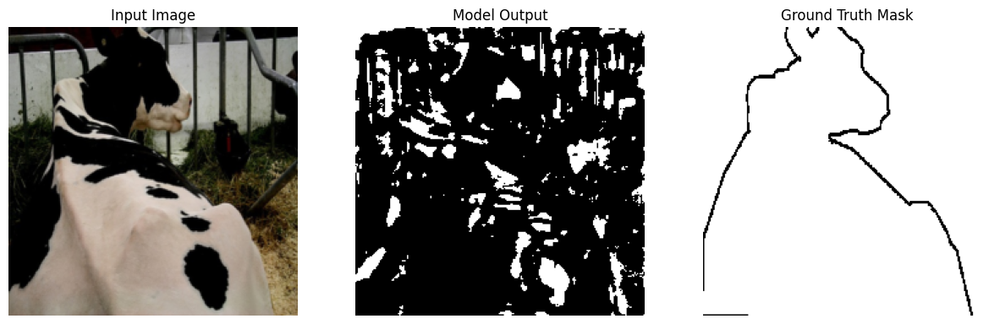

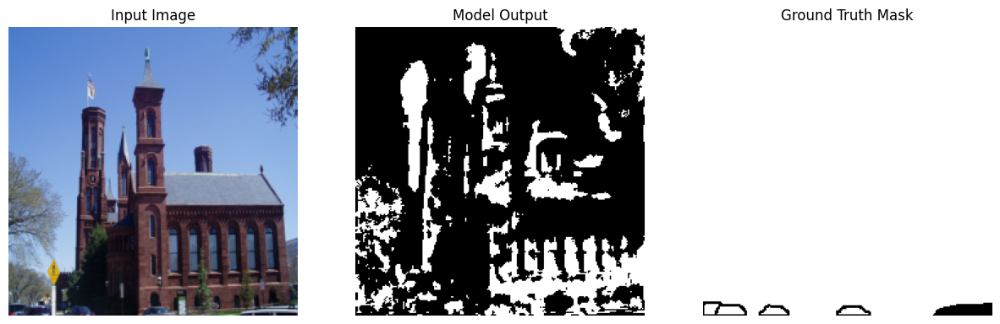

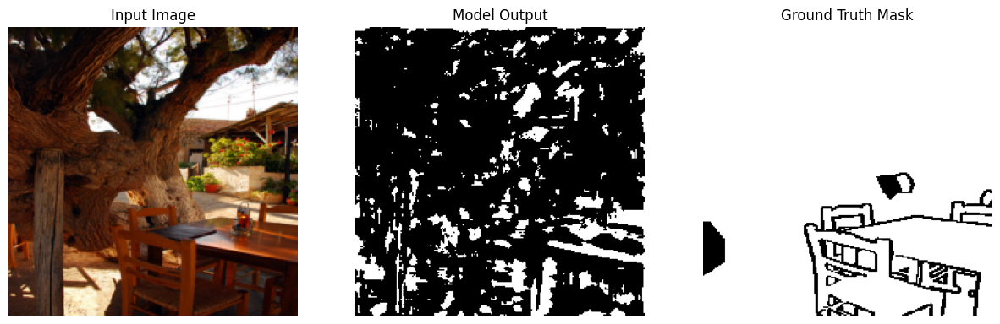

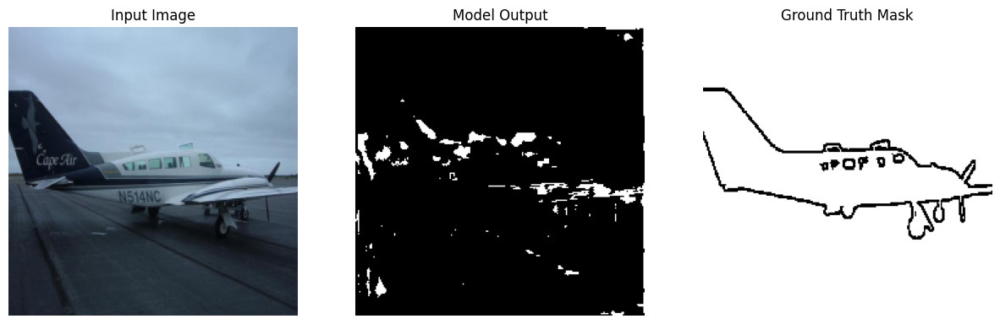

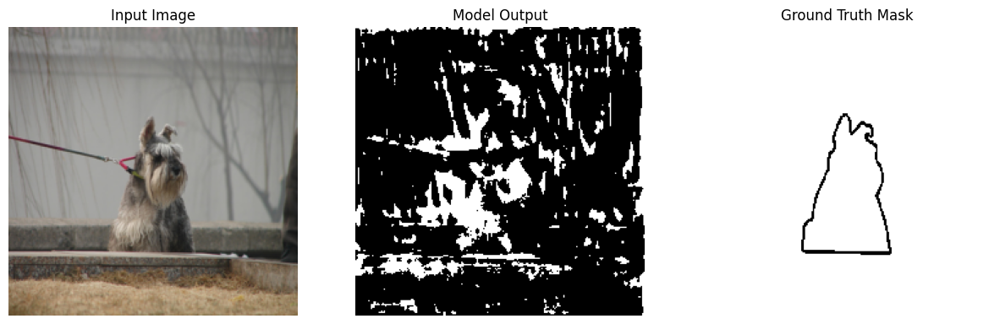

In [ ]:
for i in range(5):
  random_index = random.randint(0, len(test_dataset) - 1)
  display_results_avg(model, test_dataset, random_index)

## **Fused output on untrained model**

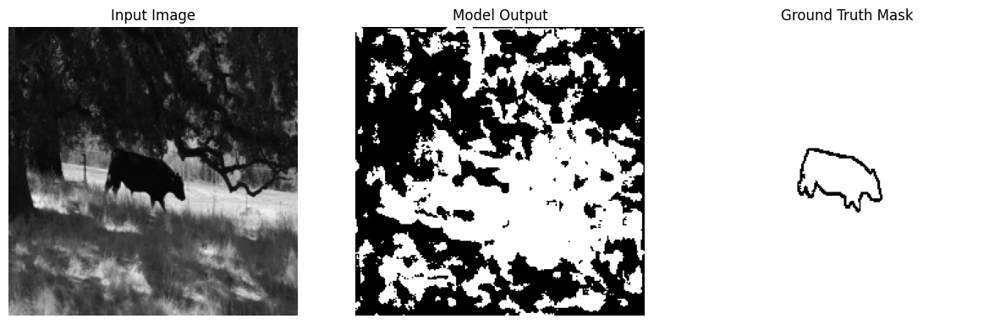

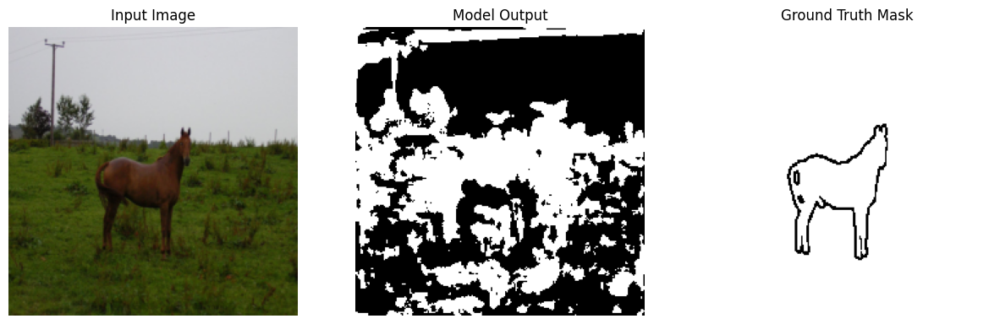

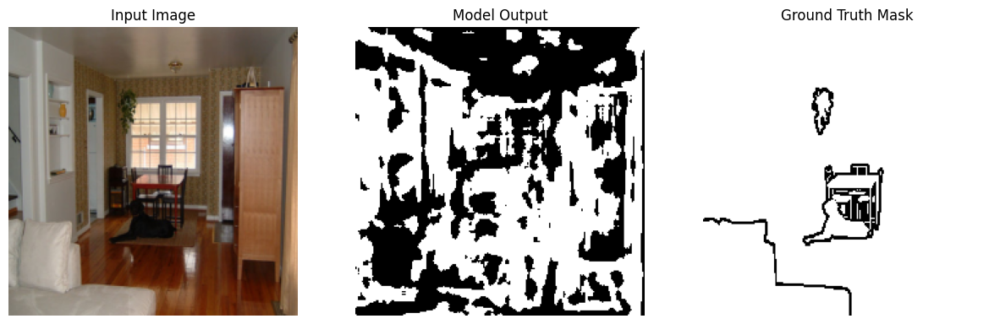

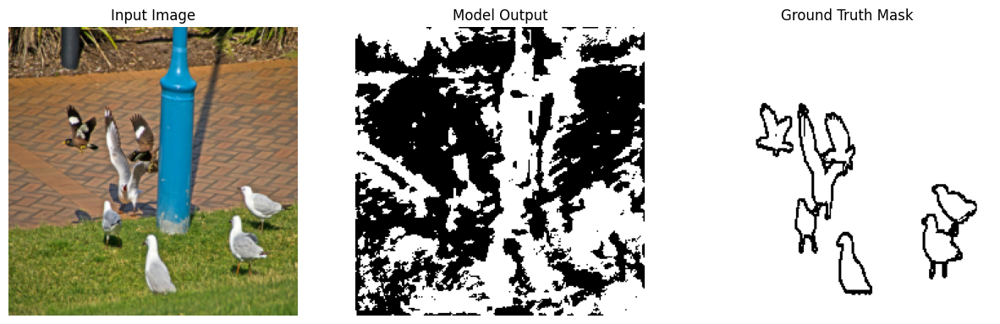

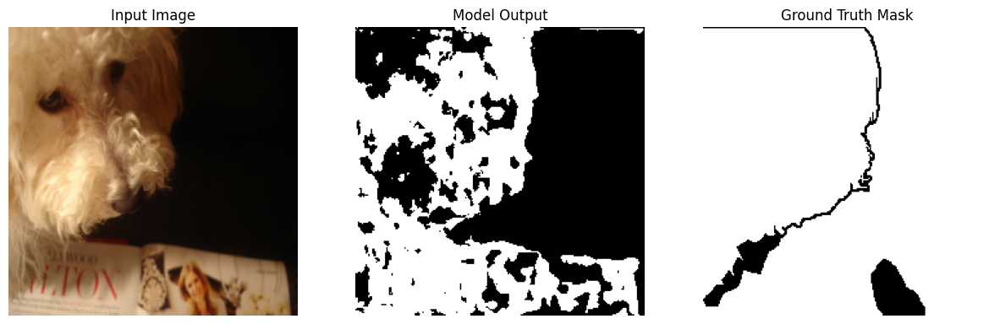

In [ ]:
for i in range(5):
  random_index = random.randint(0, len(test_dataset) - 1)
  display_results_fuse(model, test_dataset, random_index)

## **Training and Validation Loop**

In [ ]:
# Training and validation loop over specified epochs
for epoch in range(EPOCHS):
  average_train_loss = train(model,train_loader,criterion,optimizer) # Train the model for one epoch and get the average loss
  print(f"average train loss is {average_train_loss}")  # Print the average training loss for the epoch

  # Every 5 epochs print the validation loss
  if(epoch % 5 == 0):
    average_val_loss = test(model, train_val_loader, criterion, optimizer)  # Test the model for one epoch and get the average loss
    print(f"average val loss is {average_train_loss}")  # Print the average validation loss for the epoch

   train: 100%|██████████| 46/46 [00:33<00:00,  1.38it/s, loss=0.695]


accuracy is 0.0
average train loss is 0.6947210431098938


   test: 100%|██████████| 92/92 [00:37<00:00,  2.48it/s, loss=0.586]


accuracy is 0.0
average val loss is 0.6947210431098938


   train: 100%|██████████| 46/46 [00:32<00:00,  1.43it/s, loss=0.558]


accuracy is 0.0
average train loss is 0.5580508236003958


   train: 100%|██████████| 46/46 [00:32<00:00,  1.44it/s, loss=0.562]


accuracy is 0.0
average train loss is 0.5618452436250189


   train: 100%|██████████| 46/46 [00:31<00:00,  1.45it/s, loss=0.532]


accuracy is 0.0
average train loss is 0.5317345073689586


   train: 100%|██████████| 46/46 [00:32<00:00,  1.42it/s, loss=0.508]


accuracy is 0.0
average train loss is 0.507860137068707


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.48]


accuracy is 0.0
average train loss is 0.47958617625029193


   test: 100%|██████████| 92/92 [00:37<00:00,  2.46it/s, loss=0.463]


accuracy is 0.0
average val loss is 0.47958617625029193


   train: 100%|██████████| 46/46 [00:32<00:00,  1.43it/s, loss=0.481]


accuracy is 0.0
average train loss is 0.48117856357408606


   train: 100%|██████████| 46/46 [00:31<00:00,  1.45it/s, loss=0.471]


accuracy is 0.0
average train loss is 0.47053501722605334


   train: 100%|██████████| 46/46 [00:32<00:00,  1.43it/s, loss=0.435]


accuracy is 0.0
average train loss is 0.4352500360944997


   train: 100%|██████████| 46/46 [00:32<00:00,  1.43it/s, loss=0.432]


accuracy is 0.0
average train loss is 0.4317587594623151


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.469]


accuracy is 0.0
average train loss is 0.46931063675362134


   test: 100%|██████████| 92/92 [00:37<00:00,  2.46it/s, loss=0.488]


accuracy is 0.0
average val loss is 0.46931063675362134


   train: 100%|██████████| 46/46 [00:32<00:00,  1.42it/s, loss=0.431]


accuracy is 0.0
average train loss is 0.43102394757063495


   train: 100%|██████████| 46/46 [00:31<00:00,  1.45it/s, loss=0.424]


accuracy is 0.0
average train loss is 0.4235218112235484


   train: 100%|██████████| 46/46 [00:32<00:00,  1.42it/s, loss=0.427]


accuracy is 0.0
average train loss is 0.4274864993665529


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.421]


accuracy is 0.0
average train loss is 0.42072997015455493


   train: 100%|██████████| 46/46 [00:32<00:00,  1.42it/s, loss=0.412]


accuracy is 0.0
average train loss is 0.4120055398215418


   test: 100%|██████████| 92/92 [00:37<00:00,  2.49it/s, loss=0.398]


accuracy is 0.0
average val loss is 0.4120055398215418


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.413]


accuracy is 0.0
average train loss is 0.4126776184724725


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.403]


accuracy is 0.0
average train loss is 0.4032460988863655


   train: 100%|██████████| 46/46 [00:31<00:00,  1.44it/s, loss=0.409]


accuracy is 0.0
average train loss is 0.4086100115724232


   train: 100%|██████████| 46/46 [00:31<00:00,  1.45it/s, loss=0.408]

accuracy is 0.0
average train loss is 0.4077607231295627


## **Fused output on trained model With threshold as 0.5 (Will probably delete this cell)**

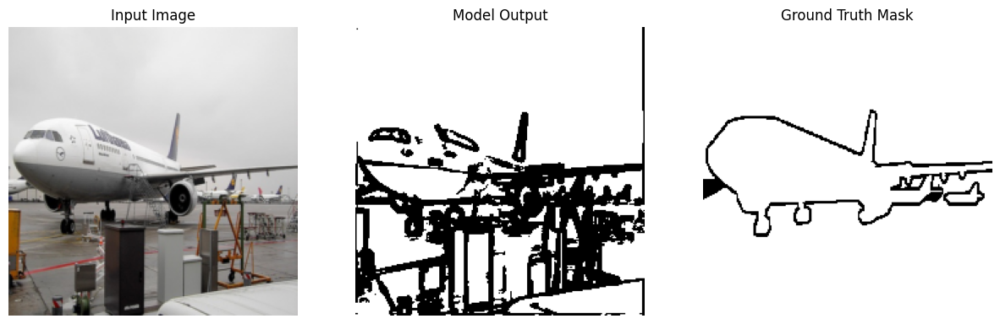

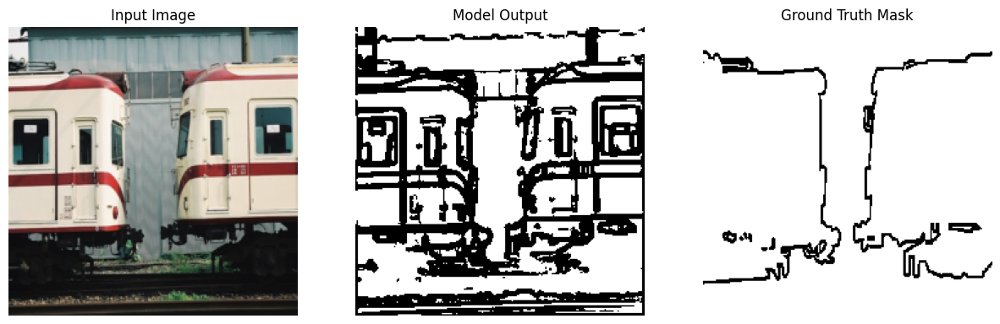

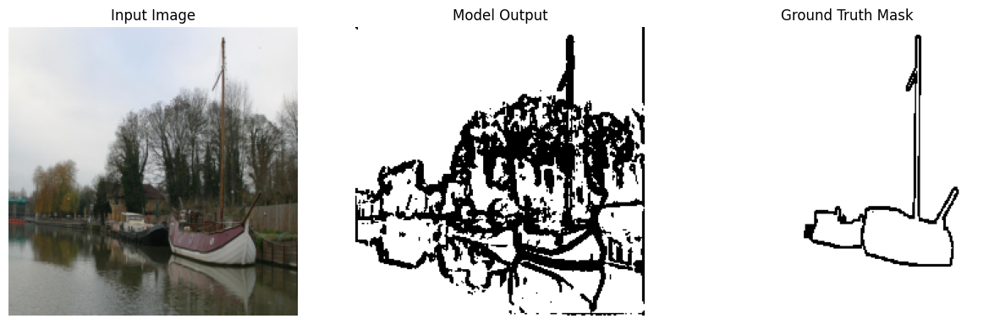

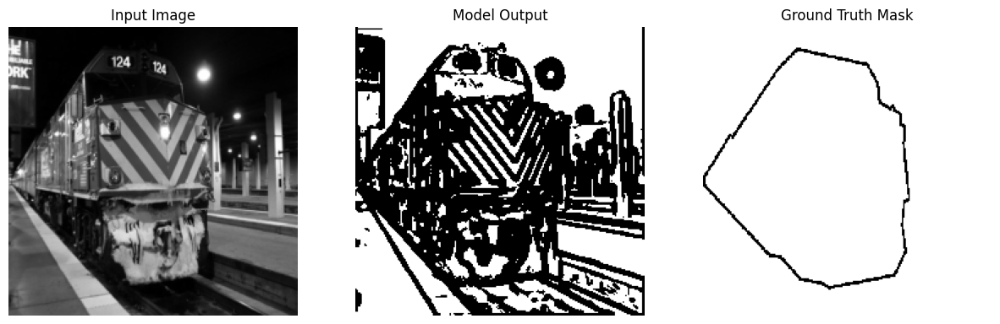

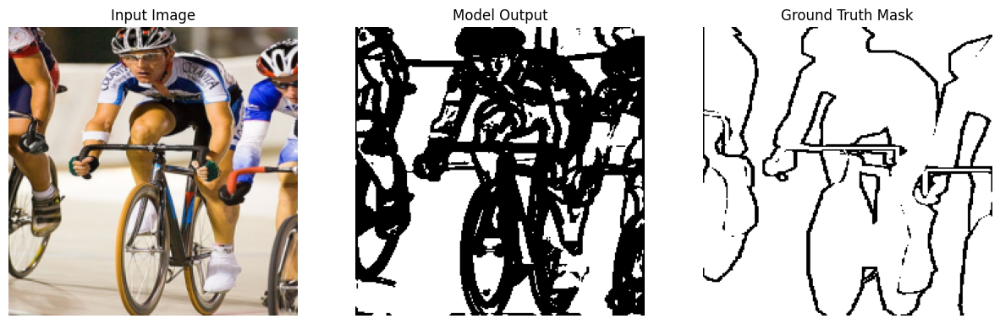

In [ ]:
for i in range(5):
  display_results_fuse(model, test_dataset, i, 0.515)

## **Model output on trained model**

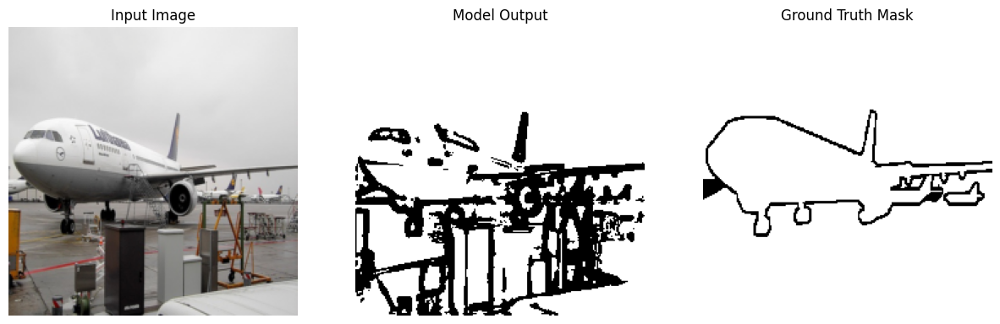

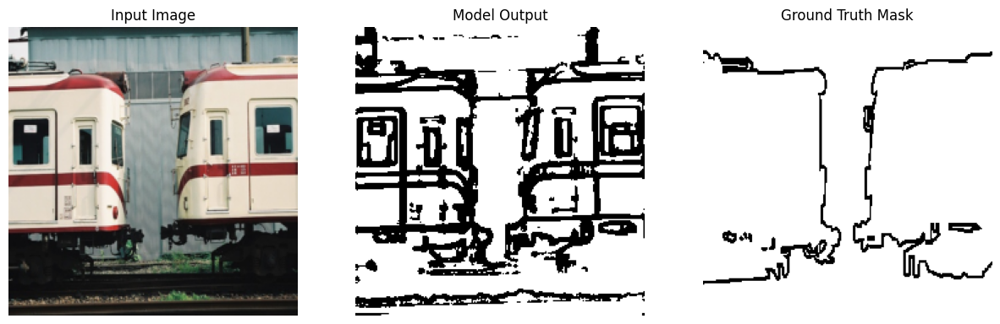

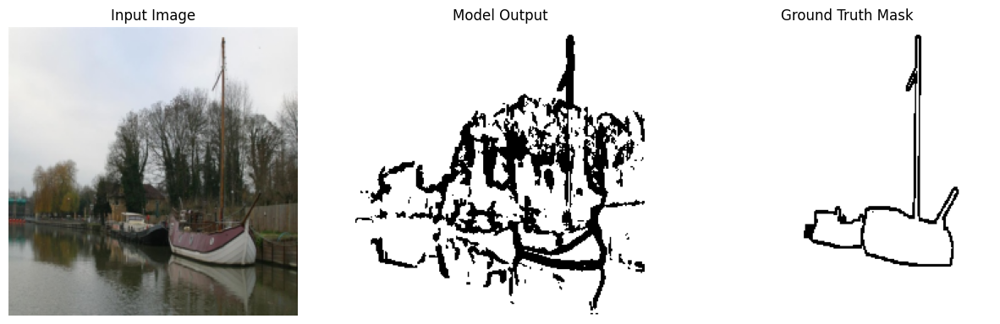

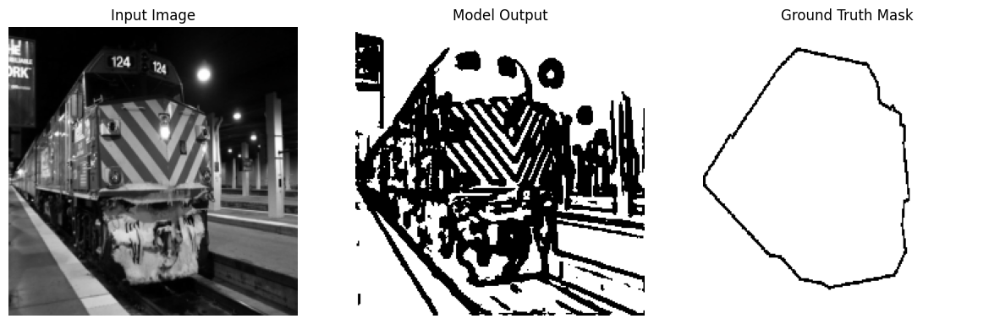

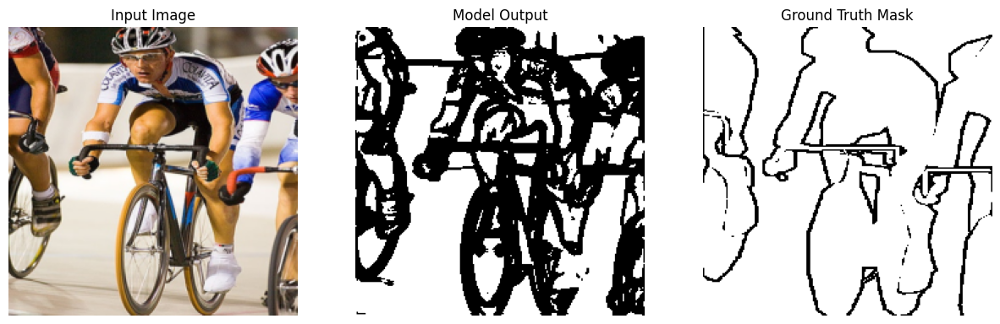

In [ ]:
for i in range(5):
  display_results_avg(model, test_dataset, i, 0.470)

## **Fused output on trained model**

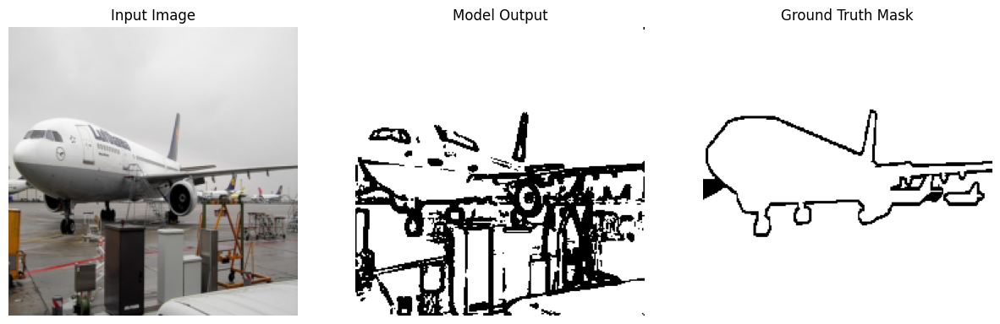

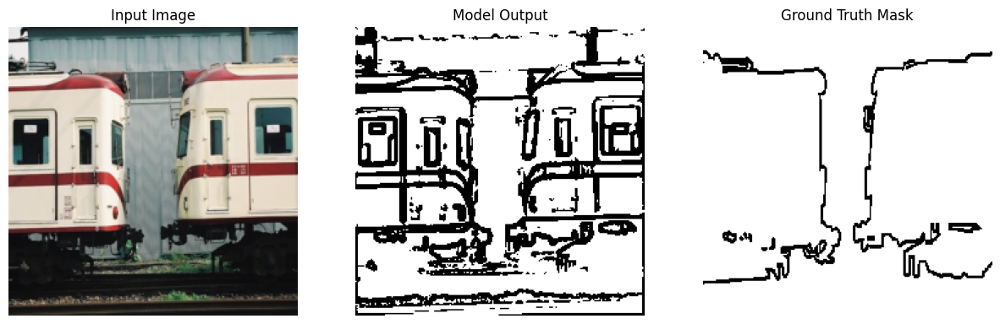

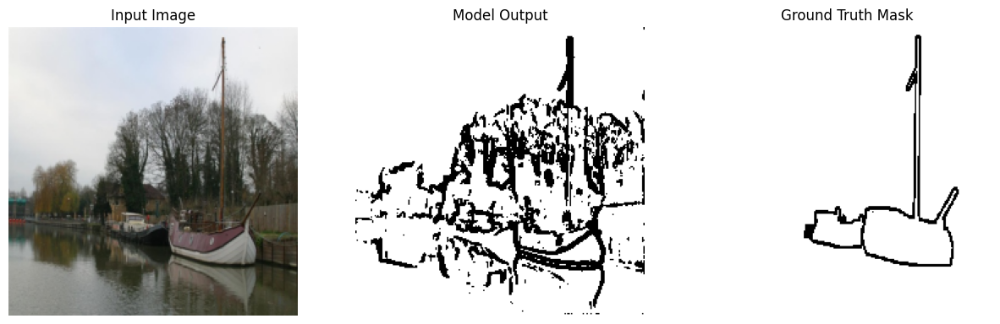

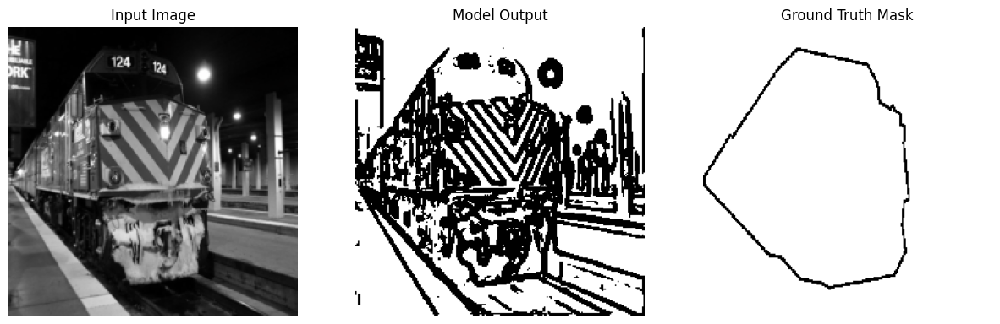

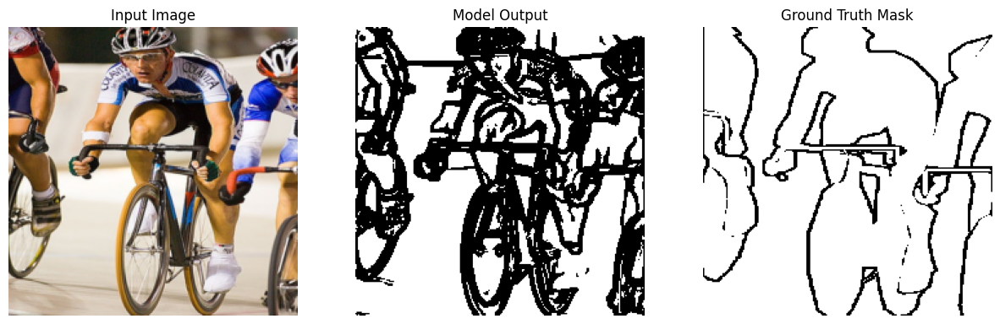

In [ ]:
for i in range(5):
  display_results_fuse(model, test_dataset, i, 0.45)

## **Model output on trained model using random images from the dataset**

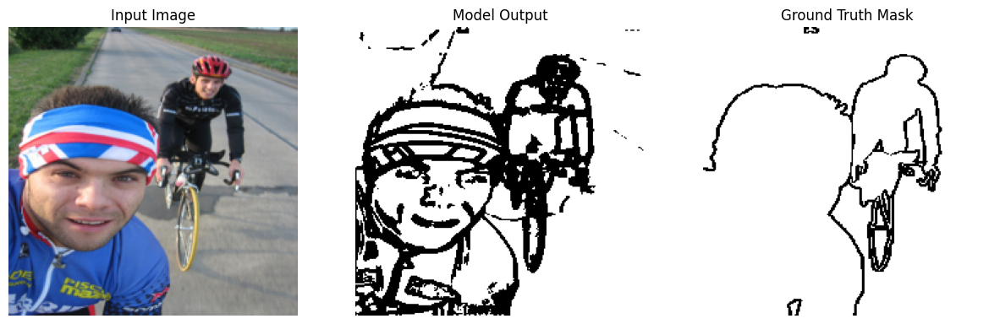

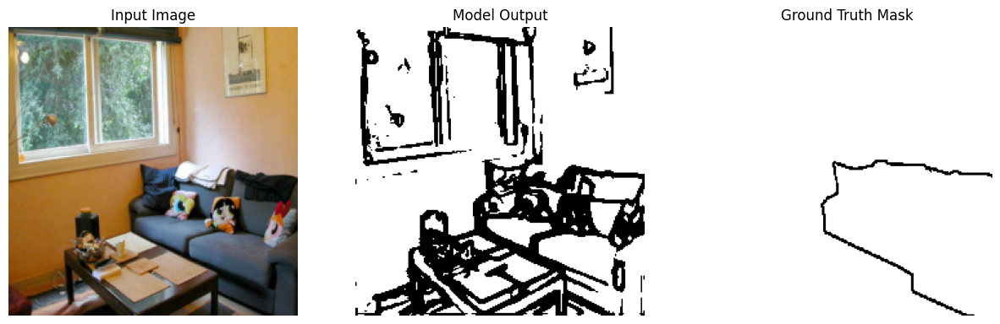

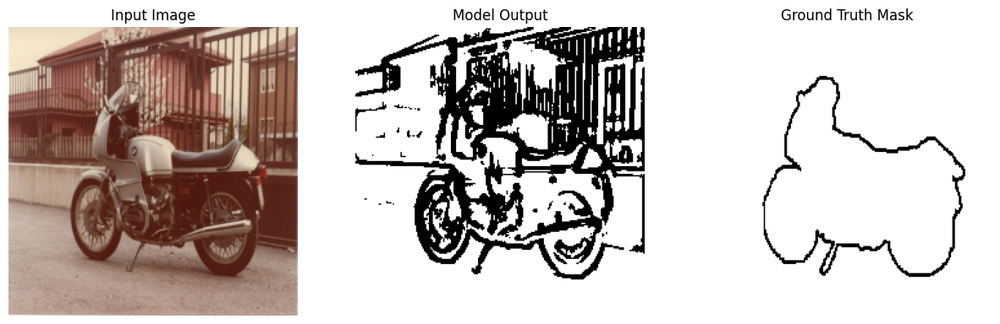

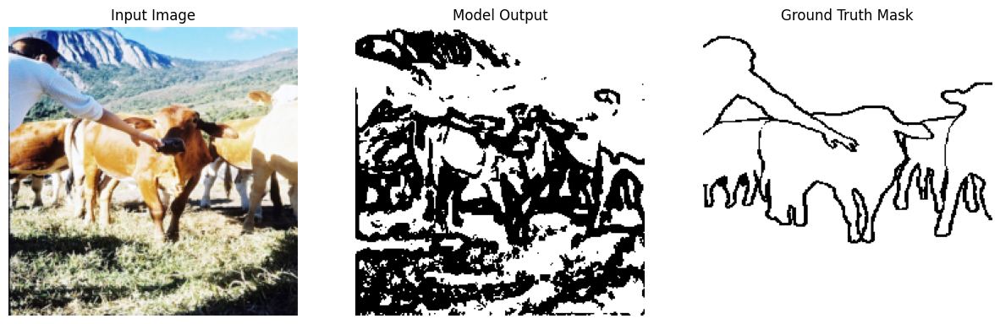

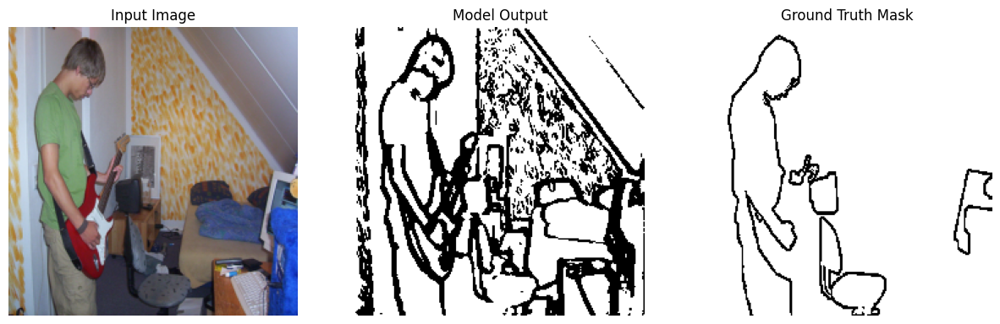

In [ ]:
for i in range(5):
  random_index = random.randint(0, len(test_dataset) - 1)
  display_results_avg(model, test_dataset, random_index , 0.46)

## **Fused output on trained model using random images from the dataset**

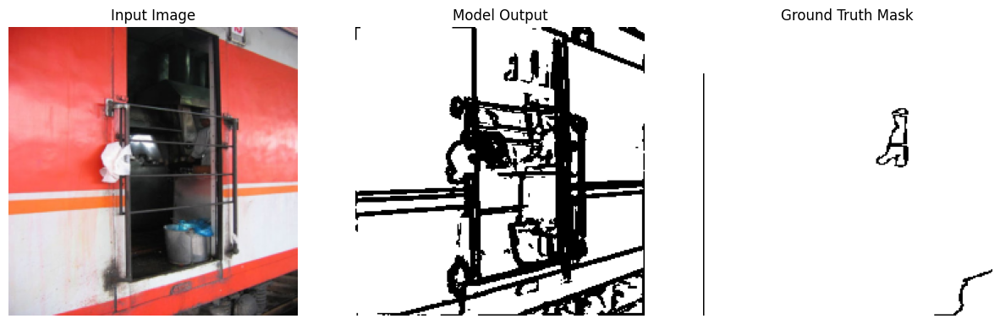

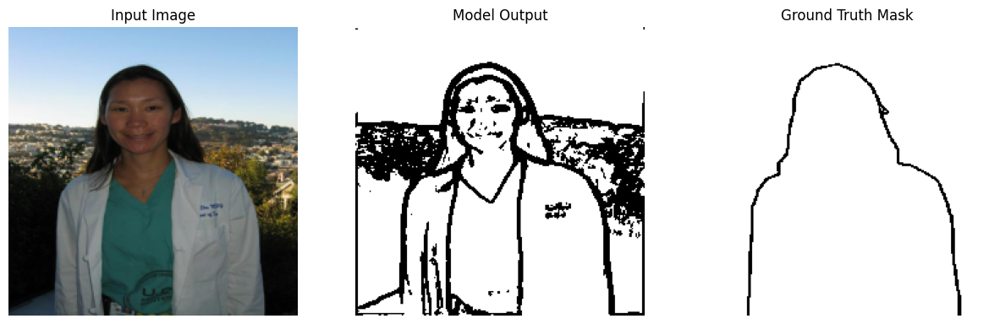

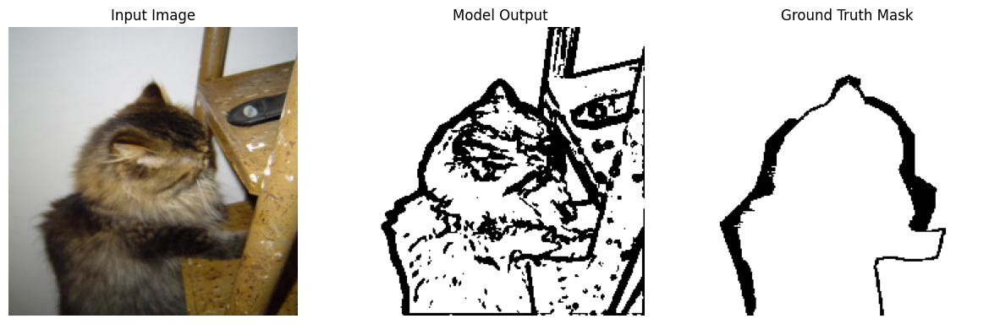

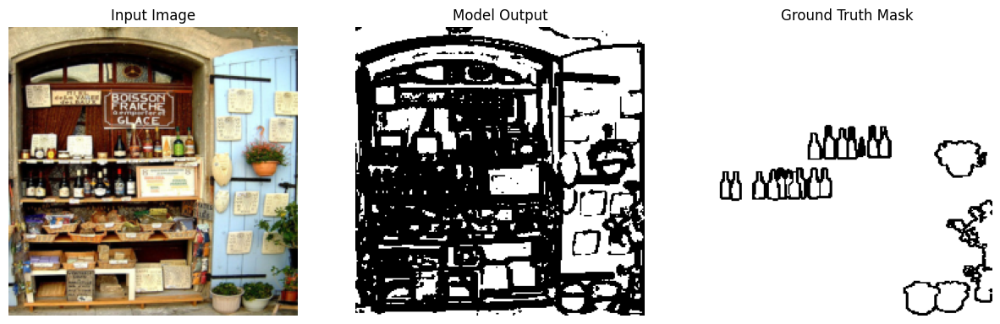

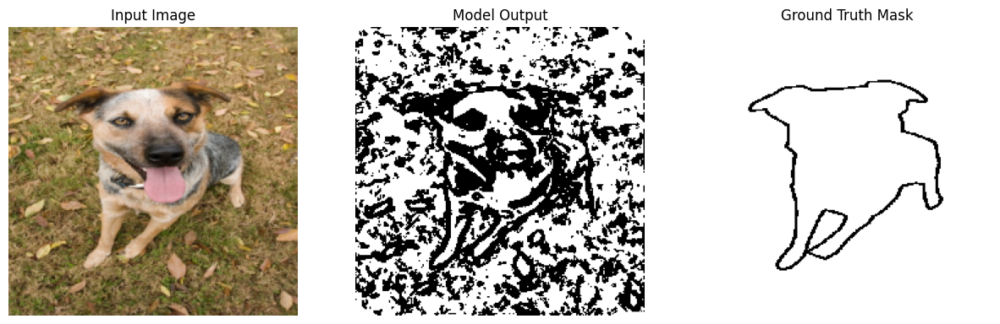

In [ ]:
for i in range(5):
  random_index = random.randint(0, len(test_dataset) - 1)
  display_results_fuse(model, test_dataset, random_index , 0.50)

## **Image Preprocessing: JPEG to Normalized Tensor Converter**

In [ ]:
def jpeg_to_tensor(image_path):
    """
    Convert a JPEG image to a normalized tensor of size 224 X 224

    Parameters:
        image_path (str): Path to the JPEG image file.

    Returns:
        torch.Tensor: A tensor representing the image, with pixel values normalized.
    """
    # Load the image
    image = Image.open(image_path).convert('RGB')

    # Define transformations: convert to tensor and normalize
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Apply transformations
    tensor_image = transform(image)

    return tensor_image

## **Visualizing Average Edge Detection Output from JPEG**

In [ ]:
def display_avg_output_from_path(model, image_path, threshold=0.5):
  """
  Takes in image_path of a jpeg image and displays the image and model output (using the avg metric)

  Parameters:
        model (torch.nn.Module): The trained model to generate predictions.
        image_path (string): The image path of the jpeg image
        threshold (int): - value between 0 and 1 (inclusive) to convert model probability output to 0-1 (edge, non-edge)

  """

  image_tensor = jpeg_to_tensor(image_path)
  model.eval()  # Set model to evaluation mode

  with torch.no_grad():
      input_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
      input_tensor = input_tensor.to(device) # Send to device
      fuse_output, d1, d2, d3, d4, d5 = model(input_tensor)  # Forward pass

      # Average the outputs from the side layers and the final output
      predicted_map = (fuse_output+ d1 + d2 + d3 + d4 + d5)/6
      predicted_map = torch.sigmoid(predicted_map) # Apply sigmoid to convert to probabilities

      # Process model output (batch_size, 1, 224, 224) -> remove batch dim and squeeze channel dim
      predicted_map = predicted_map.squeeze(0).squeeze(0)
      predicted_map = predicted_map.detach().cpu().numpy()
      predicted_map = (predicted_map > threshold).astype(int)

  for channel in range(3):
      image_tensor[channel, :, :] = (image_tensor[channel, :, :] * imagenet_std[channel]) + imagenet_mean[channel]
  image_np = image_tensor.permute(1, 2, 0).numpy()


  # Setup the plot for displaying images
  fig, axs = plt.subplots(1, 2, figsize=(15, 5))
  axs[0].imshow(image_np)
  axs[0].set_title('Input Image')
  axs[0].axis('off')

  axs[1].imshow(predicted_map, cmap='gray')
  axs[1].set_title('Model Output')
  axs[1].axis('off')

  plt.show()

## **Visualizing Fused Edge Detection Output from JPEG**

In [ ]:
def display_fuse_output_from_path(model, image_path, threshold=0.5):
  """
  Takes in image_path of a jpeg image and displays the image and model output (using the fuse metric)

  Parameters:
        model (torch.nn.Module): The trained model to generate predictions.
        image_path (string): The image path of the jpeg image
        threshold (int): - value between 0 and 1 (inclusive) to convert model probability output to 0-1 (edge, non-edge)

  """

  image_tensor = jpeg_to_tensor(image_path)
  model.eval()  # Set model to evaluation mode

  with torch.no_grad():
      input_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
      input_tensor = input_tensor.to(device) # Send to device
      fuse_output, d1, d2, d3, d4, d5 = model(input_tensor)  # Forward pass

      predicted_map = torch.sigmoid(fuse_output) # Apply sigmoid to convert to probabilities

      # Process model output (batch_size, 1, 224, 224) -> remove batch dim and squeeze channel dim
      predicted_map = predicted_map.squeeze(0).squeeze(0)
      predicted_map = predicted_map.detach().cpu().numpy()
      predicted_map = (predicted_map > threshold).astype(int)

  for channel in range(3):
      image_tensor[channel, :, :] = (image_tensor[channel, :, :] * imagenet_std[channel]) + imagenet_mean[channel]
  image_np = image_tensor.permute(1, 2, 0).numpy()


  # Setup the plot for displaying images
  fig, axs = plt.subplots(1, 2, figsize=(15, 5))
  axs[0].imshow(image_np)
  axs[0].set_title('Input Image')
  axs[0].axis('off')

  axs[1].imshow(predicted_map, cmap='gray')
  axs[1].set_title('Model Output')
  axs[1].axis('off')

  plt.show()

## **Average and Fuse output on JPEG's outside the Dataset**

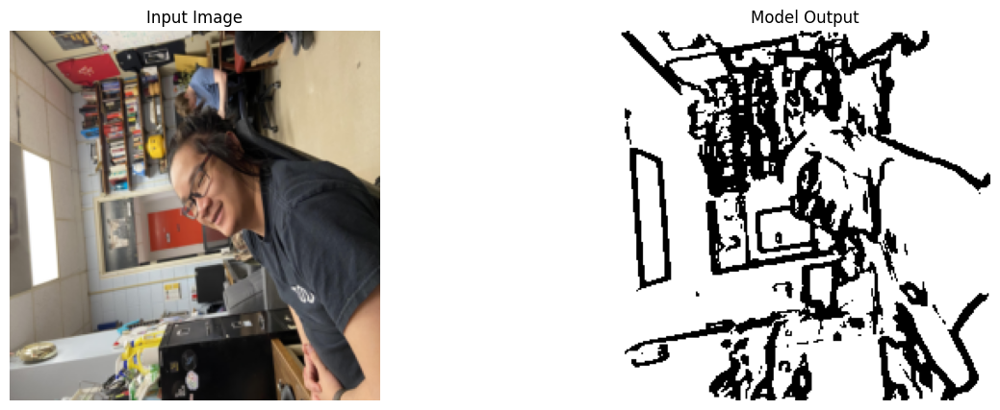

In [ ]:
display_avg_output_from_path(model, 'IMG_7238.jpg', 0.43)

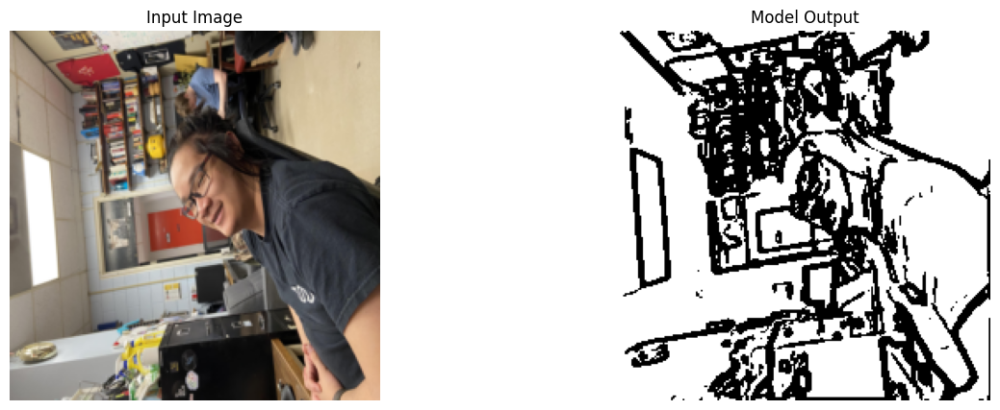

In [ ]:
display_fuse_output_from_path(model, 'IMG_7238.jpg', 0.44)

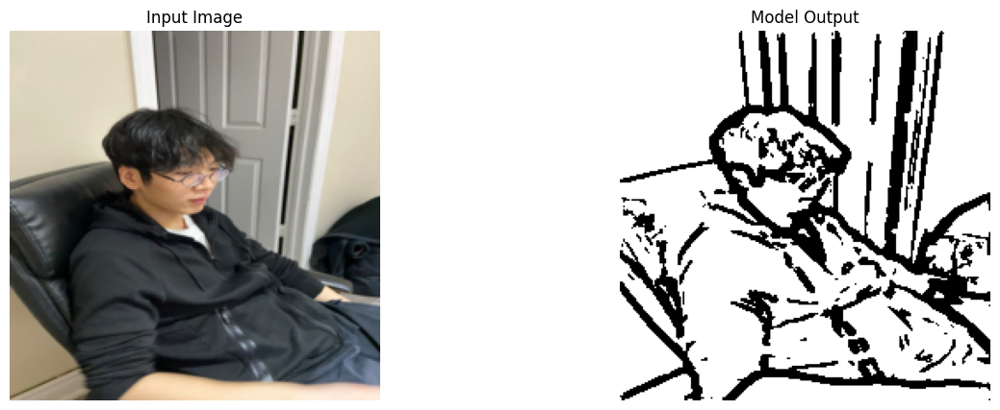

In [ ]:
display_avg_output_from_path(model, 'TK_test.jpg', 0.47)

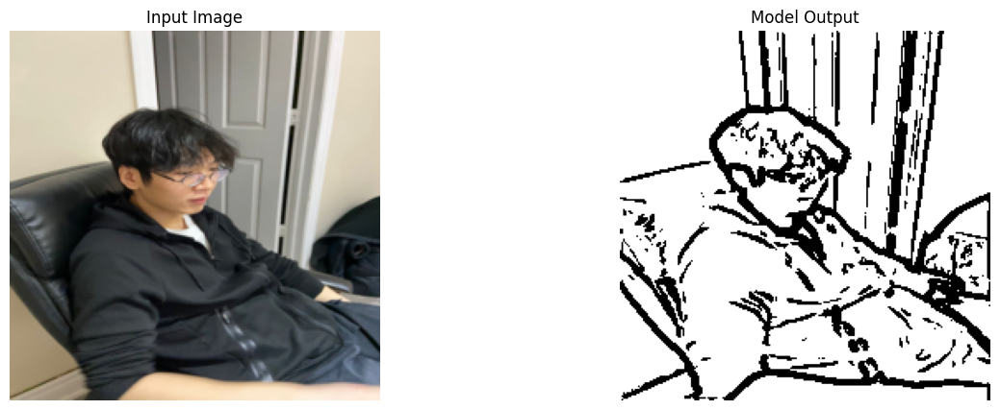

In [ ]:
display_fuse_output_from_path(model, 'TK_test.jpg', 0.44)

## **Final Results**
We begin our discussion by looking at the results produced on images from the dataset. We will first analyze the average output from our untrained model. The model in its untrained state is unable to differentiate between edges and non-edges effectively. The model's outputs appear to be noisy and lack clear and distinct edges when compared to the ground truth masks. Such an outcome is expected, given that the model hasn't been trained on the nuanced features that delineate edges in the dataset. Progressing to the fused outputs on the untrained model, we encounter a similar scenario. The outputs do not reflect the edges evident in the ground truth masks. This result is consistent with expectations, given the absence of training that would allow the model to recognize and delineate edges within the images.

As we examined the average outputs from our trained model, we conducted a series of experiments with different thresholds leading us to identify 0.45 as the most effective. This optimal threshold after training the model has improved its ability to distinguish between edges and non edges, allowing us to effectively detect semantic edges. The model output and ground truth mask are very similar. With a threshold of 0.45-0.47, the model output has a cleaner edge detection with less noise, mirroring the ground truth. The improvements indicate that the model, upon training, has learned to focus on the relevant gradients and textures that constitute the edges of the train. Next we consider the fused outputs from our trained model. Having evaluated various thresholds, the threshold of 0.45-0.50 emerged as the best choice.  At this threshold, the fused output is very precise, closely mirroring the ground truth.  The fused output produces edges that are more refined than the ones produced by the average method indicating that using the fusion layer is a better solution.

Upon reviewing the model's performance on the dataset images, we decided to evaluate our model against images not in the dataset. Both the average output and the fused output methods performed extremely well. They produced similar results and threshold value inputed for both were very close to each other.


## **Improvements**

There are a few improvements we could make to our model to improve its ability to detect edges. We could implement techniques like random scaling, cropping, rotation, and color adjustments which could make the model more robust to variations in real world scenarios. Additionaly developing a secondary network dedicated to refining the edges output by the primary HED model would improve are outputs. This network can learn to correct mistakes and sharpen the edges further. Moreover, we could also Apply post-processing steps like Conditional Random Fields (CRFs) to refine the edges in the output masks, which can smooth out predictions and improve alignment with true edges. Training the model on a broader range of datasets would allow us to enhance its generalization capability, allowing us to apply the model to varied types of images. We could also potentially implement a mechanism to incorporate user feedback into the training loop, allowing the model to learn from manual corrections and continuously improve over time.



## Resources Used

https://arxiv.org/pdf/1504.06375